# Setup

In [16]:
import json
import seaborn as sns
import matplotlib.pyplot as plt
import os

In [74]:
def compute_score_delta(data1, data2, metric: str):
    delta_total_1 = []
    delta_total_2 = []
    score_lookup = {}
    for item in data2:
        q_id = str(item.get("question_id")) 
        p_id = str(item.get("program_id"))
        score_val = item.get("code_gpt_score", {}).get("code_gpt_score", 0.0) 
        
        score_lookup[(q_id, p_id)] = score_val

    for d in data1:
        task_id = str(d.get("task_id"))
        
        grade_keys = [k for k in d.keys() if k.startswith("grade-")]
        
        for g_key in grade_keys:
            program_id = g_key.replace("grade-", "") 
            
            if (task_id, program_id) in score_lookup:
                exec_binary = d[g_key].get("execution", 0.0)
                exec_custom = d[g_key].get("execution_custom", 0.0)
                pred_score = score_lookup[(task_id, program_id)]
                if metric.lower() == "cjscore" or metric.lower() == "cjbin":
                    if pred_score >= 0.0 and pred_score <= 1.0:
                        diff1 = abs(pred_score - exec_binary)
                        diff2 = abs(pred_score - exec_custom)
                        delta_total_1.append(diff1)
                        delta_total_2.append(diff2)
                elif metric.lower() == "icescore":
                    if pred_score >= 0.0 and pred_score <= 4.0:
                        diff1 = abs(pred_score - exec_binary * 4)
                        diff2 = abs(pred_score - exec_custom * 4)
                        delta_total_1.append(diff1)
                        delta_total_2.append(diff2)

    return delta_total_1, delta_total_2

In [113]:
ratio_files = ["../data/humaneval-x/humaneval_cpp_grade_evalplus_ratio.json", 
               "../data/humaneval-x/humaneval_go_grade_evalplus_ratio_bakj2.json", 
               "../data/humaneval-x/humaneval_java_grade_evalplus_ratio.json", 
               "../data/humaneval-x/humaneval_js_grade_evalplus_ratio.json", 
               "../data/humaneval-x/humaneval_python_grade_evalplus_ratio.json"]

judge_score_files = ["../codejudge_scripts/output/humaneval-x/cpp-small-test/ice_data_check/Qwen3-Next-80B-1-3-0.4-sample-0_icedata.json",
                     "../codejudge_scripts/output/humaneval-x/go-small-test/ice_data_check/Qwen3-Next-80B-1-3-0.4-sample-0_icedata.json",
                     "../codejudge_scripts/output/humaneval-x/java-small-test/ice_data_check/Qwen3-Next-80B-1-3-0.4-sample-0_icedata.json",
                     "../codejudge_scripts/output/humaneval-x/js-small-test/ice_data_check/Qwen3-Next-80B-1-3-0.4-sample-0_icedata.json",
                     "../codejudge_scripts/output/humaneval-x/python-small-test/ice_data_check/Qwen3-Next-80B-1-3-0.4-sample-0_icedata.json"]

language_name = ["CPP",
                 "Go",
                 "Java",
                 "Js",
                 "Python"]

#주의: 순서 안지키면 이상해집니다.

metric1 = "IceScore"
metric2 = "qwen3"

output_dir = "output/delta_ref"
os.makedirs(output_dir, exist_ok=True)

{'parameters': {'model': 'Qwen3-Next-80B', 'compare_prompt': [{'role': 'system', 'content': 'You will be given the code snippet for a problem. \nYour task is to rate the code snippet only on one metric.\nPlease make sure you read and understand these instructions carefully.\nPlease keep this document open while reviewing, and refer to it as needed.\n\nEvaluation Criteria:\nFunctional Correctness (0-4) - Execution-based quality of the code snippet combined with the problem. The correctness is measured by the all possible unit tests, and the comparison of the reference code. The combination of the code snippet and the problem should pass all the possible tests based on your understanding of the reference code. The length of the code snippet can not determine the correctness. You need to assess the logics line by line.\n- A score of 0  (failing all possible test) means that the code snippet is totally incorrect and meaningless.\n- A score of 4  (passing all possible test) means that the c

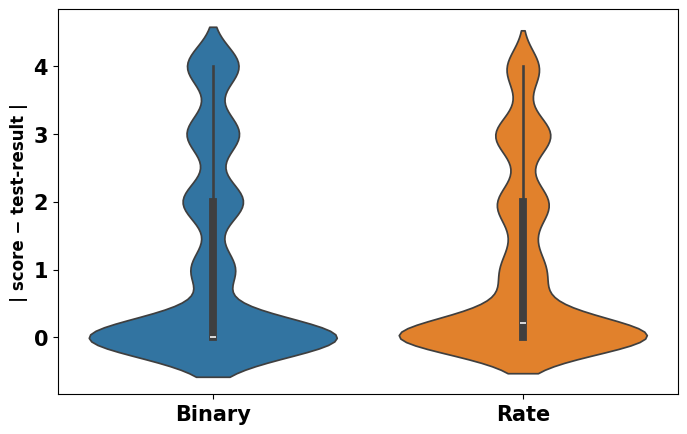

{'parameters': {'model': 'Qwen3-Next-80B', 'compare_prompt': [{'role': 'system', 'content': 'You will be given the code snippet for a problem. \nYour task is to rate the code snippet only on one metric.\nPlease make sure you read and understand these instructions carefully.\nPlease keep this document open while reviewing, and refer to it as needed.\n\nEvaluation Criteria:\nFunctional Correctness (0-4) - Execution-based quality of the code snippet combined with the problem. The correctness is measured by the all possible unit tests, and the comparison of the reference code. The combination of the code snippet and the problem should pass all the possible tests based on your understanding of the reference code. The length of the code snippet can not determine the correctness. You need to assess the logics line by line.\n- A score of 0  (failing all possible test) means that the code snippet is totally incorrect and meaningless.\n- A score of 4  (passing all possible test) means that the c

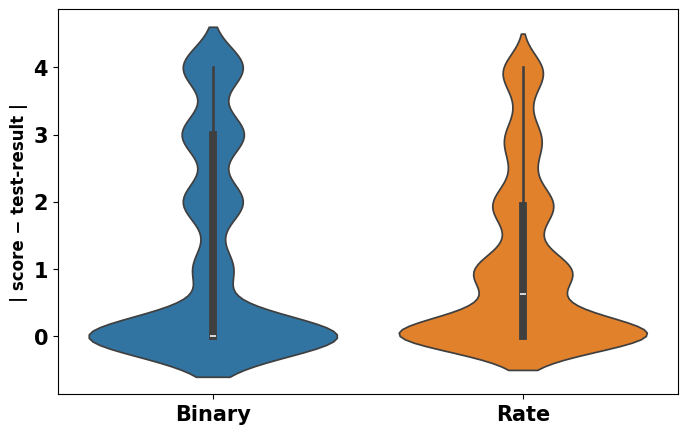

{'parameters': {'model': 'Qwen3-Next-80B', 'compare_prompt': [{'role': 'system', 'content': 'You will be given the code snippet for a problem. \nYour task is to rate the code snippet only on one metric.\nPlease make sure you read and understand these instructions carefully.\nPlease keep this document open while reviewing, and refer to it as needed.\n\nEvaluation Criteria:\nFunctional Correctness (0-4) - Execution-based quality of the code snippet combined with the problem. The correctness is measured by the all possible unit tests, and the comparison of the reference code. The combination of the code snippet and the problem should pass all the possible tests based on your understanding of the reference code. The length of the code snippet can not determine the correctness. You need to assess the logics line by line.\n- A score of 0  (failing all possible test) means that the code snippet is totally incorrect and meaningless.\n- A score of 4  (passing all possible test) means that the c

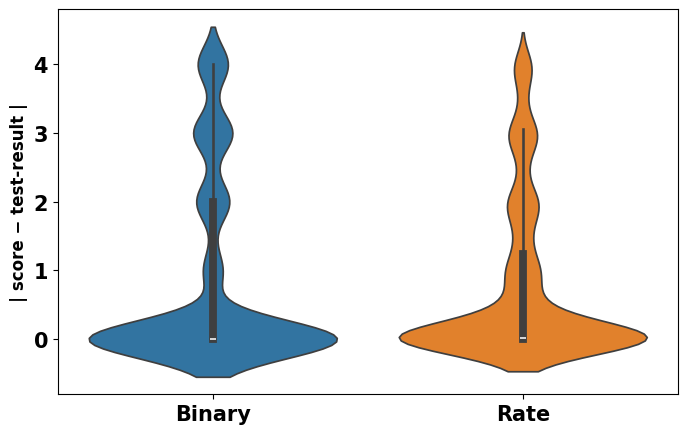

{'parameters': {'model': 'Qwen3-Next-80B', 'compare_prompt': [{'role': 'system', 'content': 'You will be given the code snippet for a problem. \nYour task is to rate the code snippet only on one metric.\nPlease make sure you read and understand these instructions carefully.\nPlease keep this document open while reviewing, and refer to it as needed.\n\nEvaluation Criteria:\nFunctional Correctness (0-4) - Execution-based quality of the code snippet combined with the problem. The correctness is measured by the all possible unit tests, and the comparison of the reference code. The combination of the code snippet and the problem should pass all the possible tests based on your understanding of the reference code. The length of the code snippet can not determine the correctness. You need to assess the logics line by line.\n- A score of 0  (failing all possible test) means that the code snippet is totally incorrect and meaningless.\n- A score of 4  (passing all possible test) means that the c

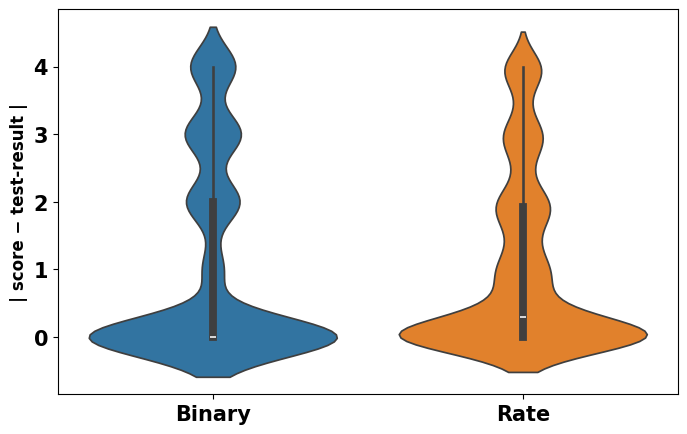

{'parameters': {'model': 'Qwen3-Next-80B', 'compare_prompt': [{'role': 'system', 'content': 'You will be given the code snippet for a problem. \nYour task is to rate the code snippet only on one metric.\nPlease make sure you read and understand these instructions carefully.\nPlease keep this document open while reviewing, and refer to it as needed.\n\nEvaluation Criteria:\nFunctional Correctness (0-4) - Execution-based quality of the code snippet combined with the problem. The correctness is measured by the all possible unit tests, and the comparison of the reference code. The combination of the code snippet and the problem should pass all the possible tests based on your understanding of the reference code. The length of the code snippet can not determine the correctness. You need to assess the logics line by line.\n- A score of 0  (failing all possible test) means that the code snippet is totally incorrect and meaningless.\n- A score of 4  (passing all possible test) means that the c

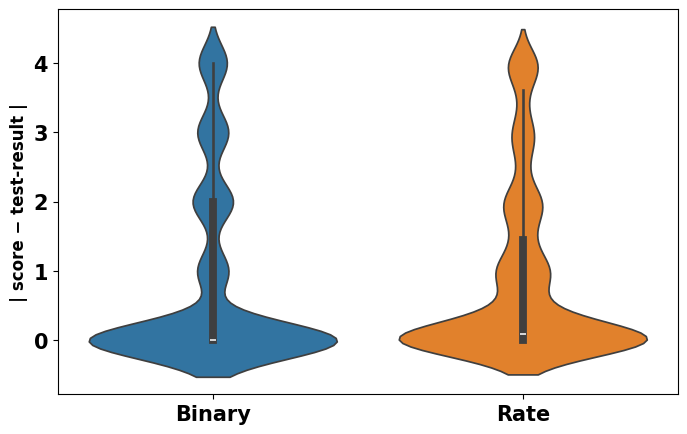

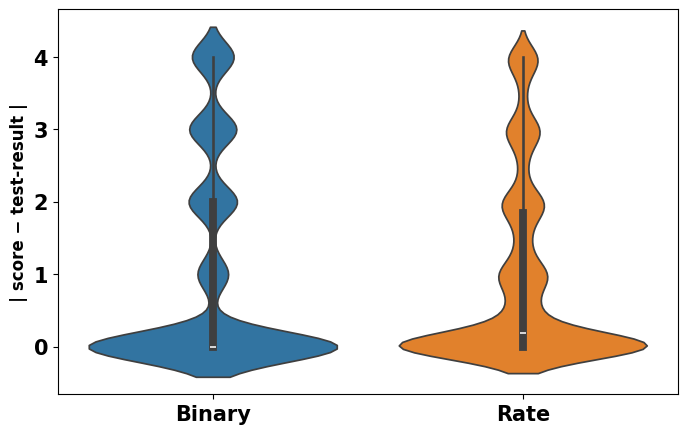

In [114]:
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['font.size'] = 15
plt.rcParams['axes.labelsize'] = 12


all_results1 = []
all_results2 = []

for lang, f1, f2 in zip(language_name, judge_score_files, ratio_files):
    with open(f1) as f:
        data1 = json.load(f)
    with open(f2) as f:
        data2 = json.load(f)
    print(data1)

    res1, res2 = compute_score_delta(data2, data1["data"], metric1)
    
    all_results1.extend(res1)
    all_results2.extend(res2)
    
    
    plt.figure(figsize=(8, 5))
    ax = sns.violinplot(data=[res1, res2])
    #plt.title(f'Score Delta Distribution({lang}, {metric1}, {metric2})', fontsize=14)
    
    plt.ylabel('| score \u2212 test-result |')
    plt.xticks(
        ticks=[0, 1], 
        labels=['Binary', 'Rate']
    )
    
    
    file_name = f"{output_dir}/delta_{metric1}_{metric2}_{lang}.png"
    plt.savefig(file_name, dpi=300, bbox_inches='tight')

    plt.show()


plt.figure(figsize=(8, 5))
ax = sns.violinplot(data=[all_results1, all_results2])

#plt.title(f'Score Delta Distribution(Overall, {metric1}, {metric2})', fontsize=14)
plt.ylabel('| score \u2212 test-result |')
plt.xticks(
    ticks=[0, 1], 
    labels=['Binary', 'Rate']
)

overall_file_name = f"{output_dir}/delta_{metric1}_{metric2}_overall.png"
plt.savefig(overall_file_name, dpi=300, bbox_inches='tight')
plt.show()